## Détection automatisée de Charlie 

### Architecture de traitement en cascade 

Ce Notebook implémente la chaîne de traitements décrite dans le rapport. Notre approche repose sur une pipeline en cascade (filtrage grossier vers analyse fine) permettant d'isoler la cible dans un environnement saturé.

Structure de la pipeline :
1.  Réduction de l'espace : Filtrage colorimétrique HSV et morphologie.
2.  Extraction locale : Descripteurs robustes (SIFT) et signature chromatique.
3.  Analyse statistique : Modélisation par *Bag of Visual Words*.
4.  Validation géométrique : Estimation d'homographie par l'algorithme RANSAC (AKAZE).
5.  Arbitrage sémantique : Raffinement final par ratios anatomiques et filtrage anti-sosies.

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

planche_path = "./original-images/"
planche_file = planche_path + "19.jpg"

<h3> Étape 1 : Réduction de l'espace de recherche par filtrage colorimétrique et morphologique </h3>

L'objectif de cette première étape est de réduire drastiquement l'espace de recherche (qui compte plusieurs millions de pixels par planche) à une liste restreinte de Régions d'Intérêt (ROI). Pour ce faire, nous exploitons la signature visuelle la plus robuste de notre cible : la prédominance des couleurs rouge et blanche sur son bonnet et son pull.

Déroulement du pipeline de pré-traitement :
1. Conversion HSV : Passage de l'espace de couleurs RGB à l'espace HSV (*Hue, Saturation, Value*) pour isoler l'information chromatique et s'affranchir des variations d'intensité lumineuse (ombres et reflets).
2. Seuillage chromatique : Création de masques stricts sur les teintes rouges (en couvrant les deux extrémités du spectre) et blanches.
3. Morphologie mathématique : Application d'une opération d'ouverture pour éliminer le bruit granulaire (les faux positifs isolés), suivie d'une fermeture verticale anisotrope. Cette dernière permet de fusionner verticalement les zones du bonnet et du pull, souvent séparées par le visage couleur chair.
4. Extraction et padding : Détection des contours sur le masque binaire final pour extraire les boîtes englobantes (ROI). Ces boîtes sont ensuite artificiellement élargies (padding de 20% en largeur et 40% en hauteur) afin de garantir l'inclusion du visage de Charlie et d'offrir suffisamment de contexte spatial pour l'algorithme SIFT de l'étape suivante.

Ici, on définit deux fonctions de pré-traitement : la première effectuant un filtrage permissif, la second effectuant une un filtrage plus aggresif.

In [14]:
def pretraitement_planche_approche1(image_path):
    image = cv2.imread(image_path)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 1. Seuils HSV
    lower_red1 = np.array([0, 60, 50])
    upper_red1 = np.array([10, 255, 255])
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)

    lower_red2 = np.array([170, 60, 50])
    upper_red2 = np.array([179, 255, 255])
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)

    mask_red = cv2.bitwise_or(mask1, mask2)
    
    # 2. Nettoyage et morphologie
    kernel_ouverture = np.ones((3, 3), np.uint8)
    mask_base = cv2.morphologyEx(mask_red, cv2.MORPH_OPEN, kernel_ouverture)
    
    # On utilise un noyau vertical (18, 8) pour lier le bonnet au pull sans fusionner les voisins
    kernel_fermeture = np.ones((18, 8), np.uint8) 
    mask_base = cv2.morphologyEx(mask_base, cv2.MORPH_CLOSE, kernel_fermeture)

    # 3. Détection des contours
    contours, _ = cv2.findContours(mask_base, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    rois = []
    image_resultat = image.copy() 

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        # Filtre pour ignorer les petits bruits
        if w < 5 or h < 12:
            continue
        # 4. Agrandissement manuel de la boîte
        # On ajoute 20% de marge en largeur et 40% en hauteur pour capturer la tête
        pad_w = int(w * 0.2)
        pad_h = int(h * 0.4)
        x_new = max(0, x - pad_w)
        y_new = max(0, y - pad_h)
        w_new = min(image.shape[1] - x_new, w + 2 * pad_w)
        h_new = min(image.shape[0] - y_new, h + 2 * pad_h)
        rois.append((x_new, y_new, w_new, h_new))
        cv2.rectangle(image_resultat, (x_new, y_new), (x_new+w_new, y_new+h_new), (0, 255, 0), 2)
    return rois, mask_base, image_resultat

In [15]:
def pretraitement_planche_approche2(image_path):
    image = cv2.imread(image_path)
    img_h, img_w = image.shape[:2]
    total_area = img_h * img_w
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # 1. Masques couleurs
    lower_red1, upper_red1 = np.array([0, 60, 50]), np.array([10, 255, 255])
    lower_red2, upper_red2 = np.array([170, 60, 50]), np.array([179, 255, 255])
    mask_red = cv2.bitwise_or(cv2.inRange(hsv, lower_red1, upper_red1),
                              cv2.inRange(hsv, lower_red2, upper_red2))
    lower_white, upper_white = np.array([0, 0, 140]), np.array([180, 80, 255])
    mask_white = cv2.inRange(hsv, lower_white, upper_white)

    # 2. Signatures rayures
    kernel_2 = np.ones((2, 2), np.uint8)
    dilated_red = cv2.dilate(mask_red, kernel_2, iterations=1)
    dilated_white = cv2.dilate(mask_white, kernel_2, iterations=1)
    # Intersection : zones où rouge et blanc sont très proches
    mask_stripes = cv2.bitwise_and(dilated_red, dilated_white)

    # 3. Morphologie
    mask_cleaned = cv2.morphologyEx(mask_stripes, cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))
    # Fusion verticale : Noyau réduit pour éviter de lier des éléments trop distants
    kernel_fermeture = np.ones((20, 8), np.uint8)
    mask_final = cv2.morphologyEx(mask_cleaned, cv2.MORPH_CLOSE, kernel_fermeture)

    # 4. Filtrage des ROI
    contours, _ = cv2.findContours(mask_final, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
   
    rois = []
    image_resultat = image.copy()

    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        # A. Filtres de taille relative 
        rel_h = h / img_h
        rel_area = (w * h) / total_area
        # Charlie est petit. On élimine ce qui dépasse ~8% de la hauteur ou 0.5% de la surface.
        if rel_h > 0.08 or rel_area > 0.005:
            continue
        # B. Filtre de taille minimale absolue
        if h < 15 or w < 5:
            continue
        # C. Ratio d'aspect 
        aspect_ratio = h / float(w)
        # On cherche une forme verticale, élimination des formes trop carrées ou trop fines
        if aspect_ratio < 1.2 or aspect_ratio > 3.5:
            continue
        # D. Filtre de densité
        roi_mask = mask_final[y:y+h, x:x+w]
        # On exige que la boîte contienne une part significative de texture "rayée" 
        densite = cv2.countNonZero(roi_mask) / float(w * h)
        if densite < 0.35: 
            continue
        # E. Padding final 
        pad_w = int(w * 0.2)
        pad_h = int(h * 0.4)
        x_new = max(0, x - pad_w)
        y_new = max(0, y - pad_h)
        w_new = min(img_w - x_new, w + 2 * pad_w)
        h_new = min(img_h - y_new, h + 2 * pad_h)
        rois.append((x_new, y_new, w_new, h_new))
        cv2.rectangle(image_resultat, (x_new, y_new), (x_new+w_new, y_new+h_new), (0, 255, 0), 2)
    return rois, mask_final, image_resultat

Test sur la planche courante et affichage du résultat.

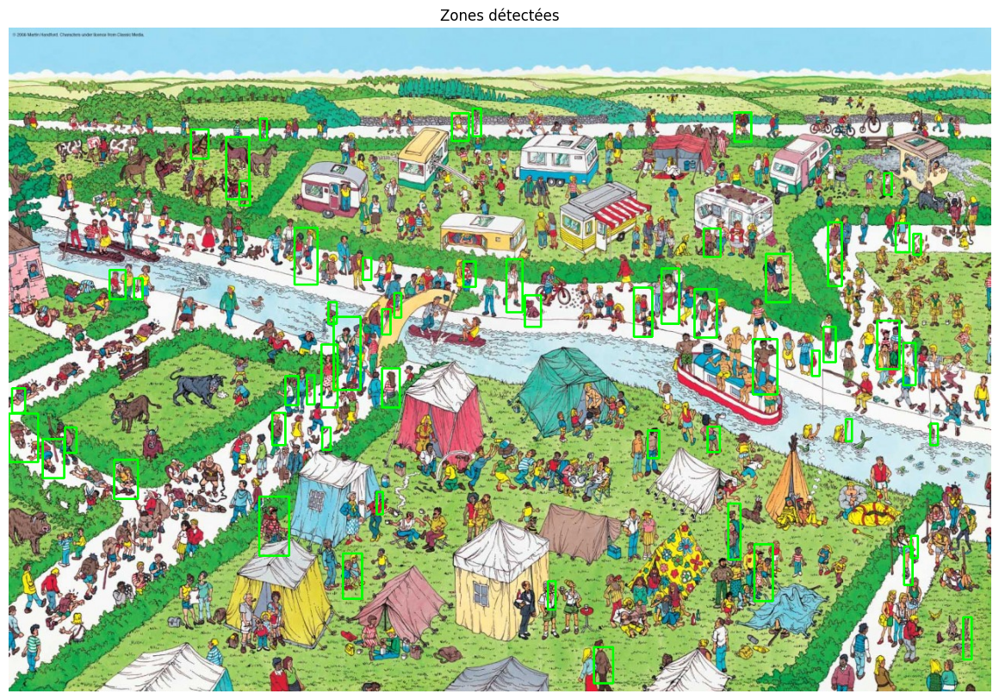

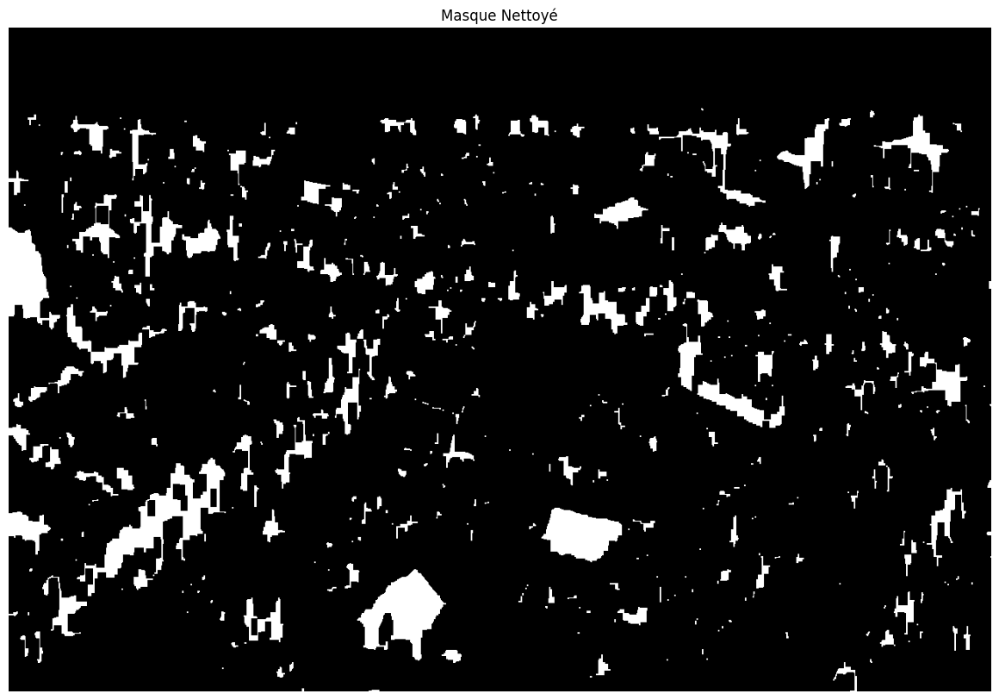

In [16]:
def pretraitement_planche(image_path, approche=1):
    if approche == 1:
        return pretraitement_planche_approche1(image_path)
    elif approche == 2:
        return pretraitement_planche_approche2(image_path)
    else:
        raise ValueError("Erreur : l'argument approche ne peut valoir que 1 ou 2.")

# IMPORTANT : Il faut changer l'argument approche à 1 si la 2 ne fonctionne pas.
# Note : après expérimentations, l'approche 2 fonctionne mieux pour la planche 19.
rois, mask, img_bbox = pretraitement_planche(planche_file, approche=2)
img_rgb = cv2.cvtColor(img_bbox, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))
plt.imshow(img_rgb)
plt.title("Zones détectées")
plt.axis('off')
plt.show()

plt.figure(figsize=(15, 10))
plt.imshow(mask, cmap='gray')
plt.title("Masque Nettoyé")
plt.axis('off')
plt.show()


<h3> Étape 2 : Extraction de primitives locales (SIFT) et enrichissement colorimétrique </h3>

Les régions d'intérêt (ROI) identifiées à l'étape 1 nous indiquent où chercher, mais nous devons maintenant caractériser la structure interne de ces zones. L'objectif de cette étape est d'extraire des points d'intérêt robustes aux changements d'échelle et de rotation à l'aide de l'algorithme **SIFT** (Scale-Invariant Feature Transform).

Cependant, SIFT opérant sur des images en niveaux de gris et nos ROI étant souvent de très petite taille, nous appliquons une série de traitements spécifiques pour maximiser nos chances de détecter Charlie :

Déroulement de l'extraction :

1. Pré-traitements (CLAHE & Upscaling) : Les ROI subissent d'abord une amélioration du contraste local (CLAHE) pour faire ressortir les gradients dans les zones d'ombre. Ensuite, nous appliquons un sur-échantillonnage d'un facteur 2 (upscaling par interpolation bicubique). SIFT appliquant un flou gaussien initial, cette étape empêche la destruction des micro-détails (comme les lunettes de Charlie).

2. Détection SIFT : Extraction des keypoints et calcul de leurs descripteurs spatiaux (vecteurs de dimension 128) sur la ROI agrandie.

3. Correction spatiale : Les coordonnées des points détectés sont divisées par 2 et replacées dans le repère global de la planche d'origine pour assurer une cohérence spatiale.

4. Enrichissement chromatique (Histogrammes HSV) : SIFT ignorant la couleur, nous calculons en parallèle des histogrammes sur les canaux Teinte (H) et Saturation (S) de la ROI (quantifiés sur 16 bins et normalisés). Ces histogrammes viendront compléter la signature SIFT pour conserver l'information cruciale du rouge et du blanc.

In [17]:
def extraire_caracteristiques_rois(image_bgr, rois):
    # Extrait les descripteurs SIFT ET les histogrammes HSV pour chaque zone d'intérêt.

    gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)
    hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    sift = cv2.SIFT_create()
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

    donnees_extraites = {}
    img_visualisation = image_bgr.copy()

    for (x, y, w, h) in rois:
        # 1. Préparation des zones
        roi_gray = gray[y:y+h, x:x+w]
        roi_hsv = hsv[y:y+h, x:x+w]
        if roi_gray.size == 0: continue
            
        # 2. SIFt
        roi_enhanced = clahe.apply(roi_gray)
        # Upscaling pour détecter plus de points sur les petits personnages
        roi_resized = cv2.resize(roi_enhanced, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        keypoints, descriptors = sift.detectAndCompute(roi_resized, None)

        # 3. Histogrammes
        # On calcule l'histogramme sur la Teinte (H) et la Saturation (S)
        # H: 180 niveaux, S: 256 niveaux. On réduit le nombre de bins pour plus de stabilité.
        hist_h = cv2.calcHist([roi_hsv], [0], None, [16], [0, 180])
        hist_s = cv2.calcHist([roi_hsv], [1], None, [16], [0, 256])
        cv2.normalize(hist_h, hist_h, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
        cv2.normalize(hist_s, hist_s, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    
        # On concatène les deux pour avoir un vecteur de couleur unique
        color_feature = np.concatenate([hist_h, hist_s]).flatten()

        # 4. Finalement, on stocke
        if descriptors is not None and len(keypoints) > 0:
            # Remise à l'échelle des points clés pour l'image originale !!
            for kp in keypoints:
                kp.pt = (kp.pt[0] / 2.0 + x, kp.pt[1] / 2.0 + y)
            donnees_extraites[(x, y, w, h)] = {
                'keypoints': keypoints, 
                'descriptors': descriptors,
                'color_feature': color_feature  
            }
            # Visualisation
            img_visualisation = cv2.drawKeypoints(img_visualisation, keypoints, img_visualisation, 
                                                 flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    return donnees_extraites, img_visualisation

Test sur la planche courante et affichage du résultat.

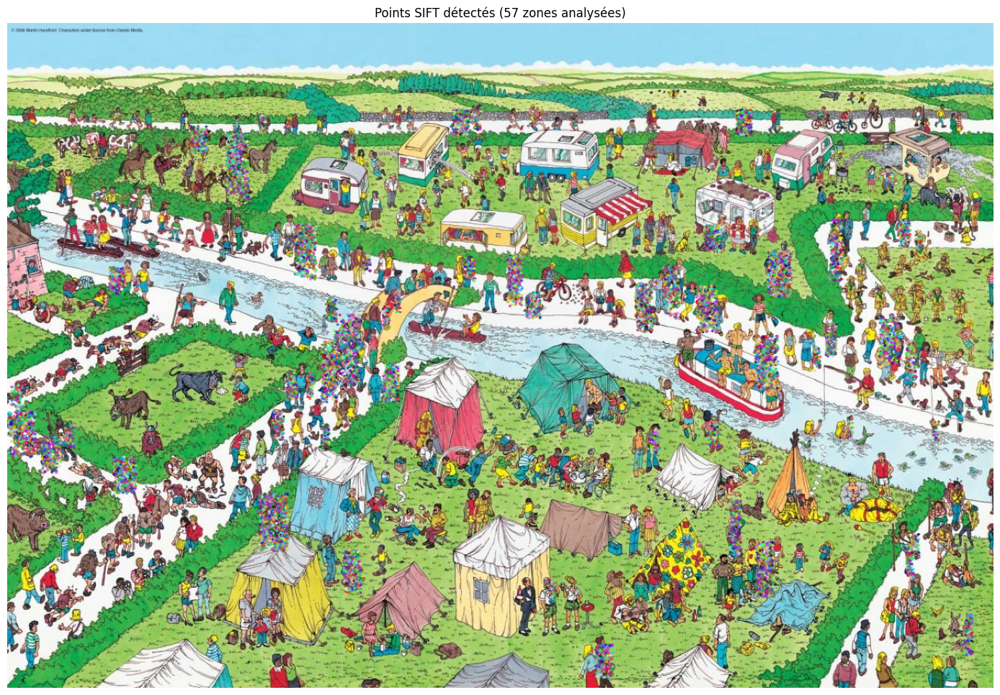

------------------------------
ANALYSE DE LA PREMIÈRE ROI : (762, 806, 25, 47)
-> Points SIFT : 146 points trouvés
-> Matrice descripteurs : (146, 128) (Format SIFT standard)
-> Vecteur couleur : (32,) (Histogramme H+S)
------------------------------


In [18]:
sift_data, img_sift = extraire_caracteristiques_rois(cv2.imread(planche_file), rois)

plt.figure(figsize=(20, 12))
plt.imshow(cv2.cvtColor(img_sift, cv2.COLOR_BGR2RGB))
plt.title(f"Points SIFT détectés ({len(sift_data)} zones analysées)")
plt.axis('off')
plt.show()

# 3. Vérification des données extraites
if len(sift_data) > 0:
    premiere_roi = list(sift_data.keys())[0]
    descripteurs = sift_data[premiere_roi]['descriptors']
    couleurs = sift_data[premiere_roi]['color_feature']
    
    print("-" * 30)
    print(f"ANALYSE DE LA PREMIÈRE ROI : {premiere_roi}")
    print(f"-> Points SIFT : {len(sift_data[premiere_roi]['keypoints'])} points trouvés")
    print(f"-> Matrice descripteurs : {descripteurs.shape} (Format SIFT standard)")
    print(f"-> Vecteur couleur : {couleurs.shape} (Histogramme H+S)")
    print("-" * 30)
else:
    print("Aucun point SIFT n'a été extrait. Vérifiez les seuils de vos ROIs.")

<h3> Étape 3 : Modélisation statistique (Bag of Visual Words) et scoring hybride </h3>

L'objectif de cette étape est de transformer la multitude de descripteurs SIFT de nos ROI en une signature statistique globale, robuste aux déformations et aux occultations partielles, via l'approche Bag of Visual Words (BoW). 

Déroulement de la modélisation et du classement :

1. Construction du vocabulaire visuel (K-Means) : Nous extrayons les descripteurs SIFT de notre base d'images de référence (`./data_bow`). Ces descripteurs sont regroupés par l'algorithme K-Means pour former un dictionnaire de "mots visuels" (ex: un coin de lunette, une transition de rayure).

2. Quantification et RootSIFT : Pour chaque ROI de la planche, les descripteurs SIFT sont associés au "mot" le plus proche du dictionnaire grâce à l'algorithme de recherche rapide **FLANN**. L'histogramme des fréquences obtenu subit ensuite une transformation **RootSIFT** (normalisation L1 suivie d'une racine carrée élément par élément) afin d'atténuer l'écrasement causé par des motifs visuels très répétitifs propres aux foules.

3. Comparaison par Max-Pooling : La signature de la ROI est comparée individuellement à chacune des 21 images de notre base de référence. Nous n'utilisons pas une simple corrélation, mais une intersection d'histogrammes, une métrique qui ne pénalise pas lourdement les parties manquantes (idéal si Charlie est à moitié caché). Seul le score de similarité maximal est conservé.

4. Score final hybride : Le score BoW (qui gère la texture et la forme) est fusionné avec le score colorimétrique calculé à l'étape 2 (qui gère l'identité rouge/blanc). Le classement de nos suspects est déterminé par la pondération suivante : $Score_{Final} = 0.9 \times Score_{BoW} + 0.1 \times Score_{Couleur}$.

In [19]:
def construire_vocabulaire(dossier_references, k=100):
    # Crée le dictionnaire de 'mots visuels' (clusters) à partir des images de référence.

    sift = cv2.SIFT_create()
    descripteurs_liste = []
    print(f"Extraction des descripteurs SIFT pour le vocabulaire (K={k})")
    # Parcours des 21 images de Charlie
    filenames = sorted(os.listdir(dossier_references))
    for filename in filenames:
        path = os.path.join(dossier_references, filename)
        img = cv2.imread(path, 0) # Lecture en niveaux de gris
        if img is not None:
            img_res = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
            # Détection des points SIFT
            _, des = sift.detectAndCompute(img_res, None)
            if des is not None:
                descripteurs_liste.append(des)
        else:
            print(f"Alerte : Impossible de lire {filename}")
    if not descripteurs_liste:
        raise ValueError("Aucun descripteur trouvé. Vérifiez le chemin du dossier data_bow svp.")
    # On empile tous les descripteurs pour le clustering
    tous_descripteurs = np.vstack(descripteurs_liste).astype(np.float32)
    print(f"Nombre total de descripteurs collectés : {len(tous_descripteurs)}")
    # Algorithme K-Means pour créer les 'mots visuels'
    print("Entraînement de K-Means...")
    bow_trainer = cv2.BOWKMeansTrainer(k)
    vocabulaire = bow_trainer.cluster(tous_descripteurs)
    print("Dictionnaire visuel construit :).")
    return vocabulaire

Après avoir défini la fonction pour la construction du vocabulaire, on s'intéresse à la comparaison des ROIs au BoW.

In [20]:
def score_intersection(h_roi, h_ref):
    # Calcule l'intersection : plus le score est haut, plus c'est similaire.
    return np.sum(np.minimum(h_roi, h_ref))

def extraire_hists(img_bgr, descriptors, vocabulaire, flann):
    # 1. BoW avec normalisation Hellinger 
    bow_hist = np.zeros(len(vocabulaire), dtype=np.float32)
    if descriptors is not None and len(descriptors) > 0:
        matches = flann.knnMatch(descriptors.astype(np.float32), vocabulaire.astype(np.float32), k=1)
        for m in matches:
            bow_hist[m[0].trainIdx] += 1
        # Normalisation L1
        bow_hist /= (np.sum(bow_hist) + 1e-6)
        # Racine carrée pour écraser les pics de fréquence trop hauts (Hellinger) 
        bow_hist = np.sqrt(bow_hist)
    # 2. Couleur HSV 
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    # 24 bins pour la teinte, 8 pour la saturation 
    color_hist = cv2.calcHist([hsv], [0, 1], None, [24, 8], [0, 180, 0, 256])
    cv2.normalize(color_hist, color_hist, 0, 1, cv2.NORM_MINMAX)
    # On aplatit et on applique aussi la racine carrée
    color_hist = np.sqrt(color_hist.flatten())
    return bow_hist, color_hist

def preparer_signatures(dossier_refs, vocabulaire):
    sift = cv2.SIFT_create()
    flann = cv2.FlannBasedMatcher_create()
    refs_data = []
    
    for filename in sorted(os.listdir(dossier_refs)):
        img = cv2.imread(os.path.join(dossier_refs, filename))
        if img is not None:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            gray_res = cv2.resize(gray, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
            _, des = sift.detectAndCompute(gray_res, None)
            b_h, c_h = extraire_hists(img, des, vocabulaire, flann)
            refs_data.append({'bow': b_h, 'color': c_h})
    return refs_data

def selectionner_suspects(image_planche, sift_data, vocabulaire, refs_data, n_top=30):
    flann = cv2.FlannBasedMatcher_create()
    scores_finaux = []
    
    for roi, data in sift_data.items():
        x, y, w, h = roi
        roi_img = image_planche[y:y+h, x:x+w]
        # Extraction ROI
        b_roi, c_roi = extraire_hists(roi_img, data['descriptors'], vocabulaire, flann)
        # On cherche la similarité maximale ici
        max_sim = 0
        for ref in refs_data:
            # Score combiné (intersection) 
            sim_bow = score_intersection(b_roi, ref['bow'])
            sim_color = score_intersection(c_roi, ref['color'])
            # Score hybride (pondération 0.9 et 0.1 trouvée expérimentalement)
            sim_totale = 0.9 * sim_bow + 0.1 * sim_color
            if sim_totale > max_sim:
                max_sim = sim_totale
        scores_finaux.append((roi, max_sim))
    
    return sorted(scores_finaux, key=lambda x: x[1], reverse=True)[:n_top]

Test sur la planche courante et affichage du résultat.

In [21]:
vocab = construire_vocabulaire("./data_bow/", k=200)
refs_data = preparer_signatures("./data_bow/", vocab)
img_planche = cv2.imread(planche_file)
meilleurs_suspects = selectionner_suspects(img_planche, sift_data, vocab, refs_data, n_top=60)
print(f"Top 1 score : {meilleurs_suspects[0][1]:.4f}")

Extraction des descripteurs SIFT pour le vocabulaire (K=200)
Alerte : Impossible de lire .DS_Store
Nombre total de descripteurs collectés : 16641
Entraînement de K-Means...
Dictionnaire visuel construit :).
Top 1 score : 10.8613


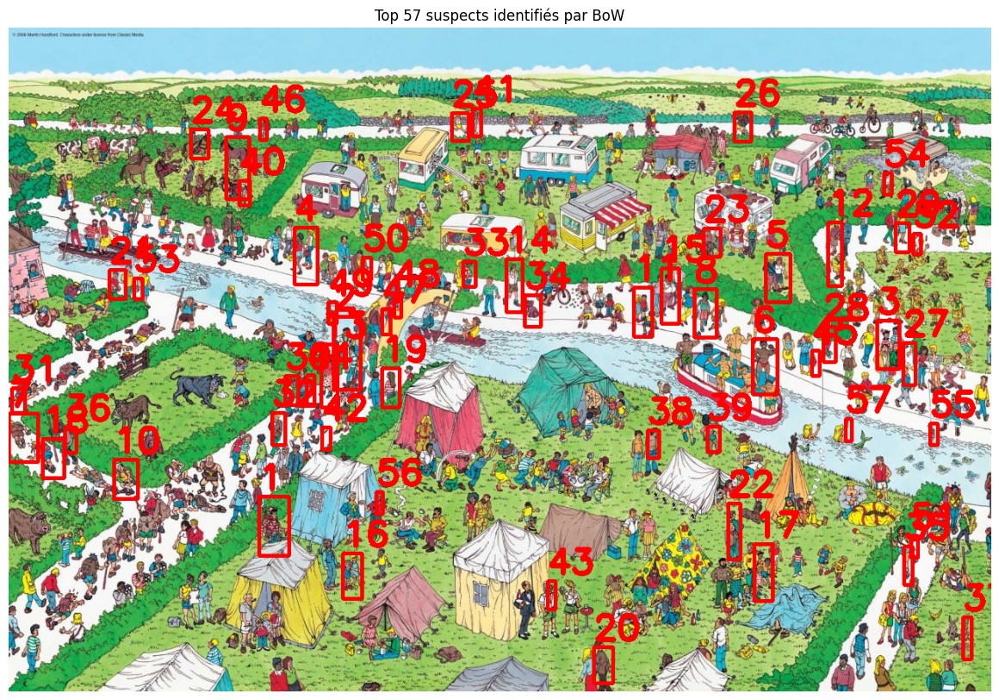

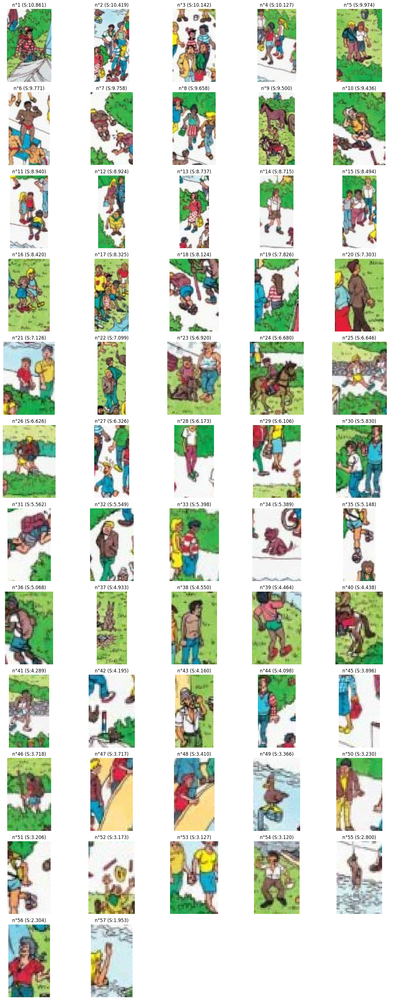

In [22]:
def visualiser_suspects_bow(image_planche_path, meilleurs_suspects):
    img_originale = cv2.imread(image_planche_path)
    img_rgb = cv2.cvtColor(img_originale, cv2.COLOR_BGR2RGB)
    # 1. Dessiner les boîtes sur l'image 
    img_boxes = img_rgb.copy()
    for i, (roi, score) in enumerate(meilleurs_suspects):
        x, y, w, h = roi
        cv2.rectangle(img_boxes, (x, y), (x+w, y+h), (255, 0, 0), 4)
        cv2.putText(img_boxes, str(i+1), (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 5)
    # Affichage de la planche
    plt.figure(figsize=(15, 10))
    plt.imshow(img_boxes)
    plt.title(f"Top {len(meilleurs_suspects)} suspects identifiés par BoW")
    plt.axis('off')
    plt.show()
    # 2. Créer la mosaïques répertoriant les boîtes les plus suspectes
    n_cols = 5
    n_rows = (len(meilleurs_suspects) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows*3))
    axes = axes.flatten()
    for i, (roi, score) in enumerate(meilleurs_suspects):
        x, y, w, h = roi
        # On ajoute une petite marge pour le contexte du zoom
        pad = 10
        y1, y2 = max(0, y-pad), min(img_rgb.shape[0], y+h+pad)
        x1, x2 = max(0, x-pad), min(img_rgb.shape[1], x+w+pad)     
        crop = img_rgb[y1:y2, x1:x2]
        axes[i].imshow(crop)
        axes[i].set_title(f"n°{i+1} (S:{score:.3f})")
        axes[i].axis('off')
    # (Cacher les subplots vides)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()

visualiser_suspects_bow(planche_file, meilleurs_suspects)

<h3>Étape 4 : Mise en correspondance et vérification géométrique (RANSAC)</h3>

L'étape précédente (BoW) a permis de filtrer les zones selon leur texture globale et leurs couleurs. Cependant, un objet désordonné (comme un parasol rayé rouge et blanc) peut encore tromper notre modèle, car le BoW ignore l'agencement spatial. L'objectif de cette étape est de vérifier si les points d'intérêt s'organisent géométriquement pour former la structure exacte de Charlie.

Déroulement de la validation géométrique :
1. Changement de descripteur (AKAZE) et Pré-traitements : Contrairement au BoW, nous utilisons ici le détecteur **AKAZE**, reconnu pour être plus performant que SIFT sur les contours nets caractéristiques des dessins. Le candidat subit un upscaling important (x3 par interpolation bicubique) et une accentuation du contraste (CLAHE) pour révéler les détails haute fréquence.

2. Filtrage des correspondances (Ratio test) : Nous mettons en correspondance les points du candidat avec ceux de nos modèles de référence. Pour éliminer les ambiguïtés répétitives propres aux foules denses, nous appliquons le test de ratio de Lowe (Lowe's ratio test) avec un seuil relâché à 0.8.

3. Estimation d'homographie (RANSAC) : Sur les paires de points restantes, l'algorithme RANSAC tente de calculer une matrice d'homographie $H$. RANSAC isole les inliers (points conformes au modèle géométrique) en rejetant les valeurs aberrantes avec une tolérance de reprojection de 5.0 pixels.

4. Vérification de vraisemblance physique : Trouver une homographie ne suffit pas. À partir de la matrice $H$, nous extrayons les facteurs d'échelle locaux ($s$). Nous imposons une contrainte stricte ($0.2 < s < 4.0$) pour rejeter tout candidat qui nécessiterait d'étirer ou de compresser le modèle de manière physiquement irréaliste.

5. Score géométrique : Les candidats validés reçoivent un score de confiance géométrique calculé selon la formule $inliers^2 / matches$, ce qui permet de pénaliser les correspondances hasardeuses et d'isoler notre meilleur suspect.

In [23]:
def valider_geometrie(meilleurs_suspects, dossier_refs, image_planche_path):
    detector = cv2.AKAZE_create()
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE_HAMMING)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    
    # 1. Préparation des modèles (upscaling x3 pour la précision)
    modeles_db = []
    for i in range(1, 22):
        path = os.path.join(dossier_refs, f"{i}.png")
        img = cv2.imread(path, 0)
        if img is not None:
            img = cv2.resize(img, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
            img = clahe.apply(img)
            kp, des = detector.detectAndCompute(img, None)
            if des is not None:
                modeles_db.append({'kp': kp, 'des': des, 'shape': img.shape, 'id': i})

    image_originale = cv2.imread(image_planche_path)
    resultats_valides = []

    for rank, (roi, score_bow) in enumerate(meilleurs_suspects):
        rank_actuel = rank + 1
        x, y, w, h = roi
        pad = 20
        y1, y2 = max(0, y-pad), min(image_originale.shape[0], y+h+pad)
        x1, x2 = max(0, x-pad), min(image_originale.shape[1], x+w+pad)
        
        roi_img_gray = cv2.cvtColor(image_originale[y1:y2, x1:x2], cv2.COLOR_BGR2GRAY)
        roi_img_gray = cv2.resize(roi_img_gray, None, fx=3, fy=3, interpolation=cv2.INTER_CUBIC)
        roi_img_gray = clahe.apply(roi_img_gray)
        
        kp_roi, des_roi = detector.detectAndCompute(roi_img_gray, None)
        if des_roi is None:
            if rank_actuel in [1, 3]: print(f"Rang {rank_actuel} rejeté : Aucun descripteur AKAZE")
            continue

        best_roi_score = -1
        best_roi_data = None

        for mod in modeles_db:
            # Ratio test de 0.8 ici
            matches = matcher.knnMatch(mod['des'], des_roi, k=2)
            good = [m for m, n in matches if m.distance < 0.8 * n.distance]

            if len(good) >= 4:
                src_pts = np.float32([mod['kp'][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
                dst_pts = np.float32([kp_roi[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
                
                # RANSAC ici
                M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0) # Seuil 5.0 au lieu de 3.0
                
                if M is not None:
                    inliers = np.sum(mask)
                    sc_x = np.sqrt(M[0,0]**2 + M[1,0]**2)
                    sc_y = np.sqrt(M[0,1]**2 + M[1,1]**2)
                    
                    # Filtre d'échelle plutôt large de [0.2 à 4.0]
                    if 0.2 < sc_x < 4.0 and 0.2 < sc_y < 4.0:
                        confiance = (inliers ** 2) / (len(good) + 1e-6)
                        if confiance > best_roi_score:
                            best_roi_score = confiance
                            best_roi_data = (M, mod['shape'], mod['id'], inliers)
            
        if best_roi_data:
            resultats_valides.append({
                'roi': (x1, y1, x2-x1, y2-y1),
                'score_geometrique': best_roi_score,
                'rank_bow': rank_actuel
            })
        elif rank_actuel in [1, 3]:
            print(f"Rang {rank_actuel} rejeté : Géométrie non valide (Inliers insuffisants ou échelle)")

    return sorted(resultats_valides, key=lambda x: x['score_geometrique'], reverse=True)

Test sur la planche courante et affichage du résultat.

In [24]:
meilleurs_suspects = selectionner_suspects(img_planche, sift_data, vocab, refs_data, n_top=30)
charlie_identifie = valider_geometrie(meilleurs_suspects, "./data_bow/", planche_file)
    
for i in range(len(charlie_identifie)):
    top = charlie_identifie[i]
    print(f"Suspect n°{i+1} : suspect classé n°{top['rank_bow']} dans l'étape 3.")

Suspect n°1 : suspect classé n°1 dans l'étape 3.
Suspect n°2 : suspect classé n°3 dans l'étape 3.
Suspect n°3 : suspect classé n°12 dans l'étape 3.
Suspect n°4 : suspect classé n°19 dans l'étape 3.
Suspect n°5 : suspect classé n°23 dans l'étape 3.
Suspect n°6 : suspect classé n°13 dans l'étape 3.
Suspect n°7 : suspect classé n°30 dans l'étape 3.
Suspect n°8 : suspect classé n°2 dans l'étape 3.
Suspect n°9 : suspect classé n°7 dans l'étape 3.
Suspect n°10 : suspect classé n°10 dans l'étape 3.
Suspect n°11 : suspect classé n°15 dans l'étape 3.
Suspect n°12 : suspect classé n°21 dans l'étape 3.
Suspect n°13 : suspect classé n°25 dans l'étape 3.
Suspect n°14 : suspect classé n°20 dans l'étape 3.
Suspect n°15 : suspect classé n°8 dans l'étape 3.
Suspect n°16 : suspect classé n°14 dans l'étape 3.
Suspect n°17 : suspect classé n°9 dans l'étape 3.
Suspect n°18 : suspect classé n°11 dans l'étape 3.
Suspect n°19 : suspect classé n°22 dans l'étape 3.
Suspect n°20 : suspect classé n°4 dans l'étape

<h3> Étape 5 : Raffinement sémantique et arbitrage final </h3>

La validation géométrique (RANSAC) peut accorder un score élevé à d'autres personnages possédant une structure géométrique similaire (comme Félicie, qui porte également un haut rayé et des lunettes). Pour désigner notre suspect principal sans ambiguïté, cette dernière étape agit comme un garde-fou sémantique spatialement invariant.

Au lieu de chercher des rayures souvent occultées par le décor, nous appliquons un arbitrage basé sur la colorimétrie et les proportions anatomiques :

Déroulement de l'arbitrage final :

1. Signature chromatique globale (HSV) : Nous mesurons la présence brute des trois couleurs fondamentales de Charlie (rouge, blanc et teinte chair) sur l'ensemble de la ROI. Cela nous affranchit des problèmes de boîtes de détection décentrées.

2. Discrimination de genre (filtre anti-sosie) : Charlie possède une signature morphologique compacte (la surface de son visage est proportionnelle à celle de son bonnet). À l'inverse, des sosies comme Félicie exposent souvent plus de peau (visage dégagé, jambes nues). Nous calculons le ratio $R = pixels_{peau} / pixels_{rouge}$. Si ce ratio excède un seuil critique ($1.4$), le candidat subit une pénalité sévère (multiplicateur de $0.4$).

3. Réintégration de la confiance statistique : Pour départager deux bonnes géométries, nous appliquons un bonus basé sur le classement initial du modèle BoW, défini par $1 / \sqrt{rang\_BoW}$.

4. Calcul du vainqueur : Le score final devient un produit composite combinant la géométrie (RANSAC), la densité de couleurs (calculée logarithmiquement pour éviter la saturation spatiale), la pénalité anti-sosie et le bonus BoW. 

Le candidat qui maximise ce score est finalement encadré comme étant Charlie.

In [25]:
def identification_finale(resultats_geometriques, image_planche_path, nb_candidats_a_tester=60):
    if not resultats_geometriques:
        print("Aucun candidat à analyser.")
        return None
    image_originale = cv2.imread(image_planche_path)
    if image_originale is None: return None
    print(f"Raffinement final  sur {min(len(resultats_geometriques), nb_candidats_a_tester)} suspects")
    candidats_valides = []

    for i, res in enumerate(resultats_geometriques[:nb_candidats_a_tester]):
        x, y, w, h = res['roi']
        crop = image_originale[y:y+h, x:x+w]
        if crop.size == 0: continue

        hsv = cv2.cvtColor(crop, cv2.COLOR_BGR2HSV)

        # 1. Masques colorimétriques
        m_r = cv2.bitwise_or(cv2.inRange(hsv, (0, 60, 50), (12, 255, 255)),
                             cv2.inRange(hsv, (165, 60, 50), (180, 255, 255)))
        m_p = cv2.inRange(hsv, (0, 20, 80), (25, 160, 255))
        m_w = cv2.inRange(hsv, (0, 0, 140), (180, 60, 255))

        nb_r, nb_p, nb_w = cv2.countNonZero(m_r), cv2.countNonZero(m_p), cv2.countNonZero(m_w)
        
        # 2. Calcul des bonus et des pénalités :
        # Charlie a un ratio Peau/Rouge équilibré (autour de 1.0).
        # Les sosies tels que Félicie ont souvent beaucoup plus de peau (ratio Peau/Rouge > 1.5).
        ratio_peau_rouge = nb_p / (nb_r + 1e-6)
        penalty_sosie = 1.0
        if ratio_peau_rouge > 1.4: # Sosie détecté par "excès de peau"
            penalty_sosie = 0.4
        # Bonus pour le rang BoW : on fait confiance au classement initial
        bonus_rang = 1.0 / (res['rank_bow'] ** 0.5)

        # 3. Score final composite
        # On combine la géométrie, la présence de couleurs et le filtre anti-sosie
        bonus_presence = np.log1p(nb_r) + np.log1p(nb_p) + np.log1p(nb_w)
        score_final = res['score_geometrique'] * bonus_presence * penalty_sosie * bonus_rang
        candidats_valides.append({'res_geo': res, 'score_final': score_final, 'crop': crop})

    # Puis on trie la liste par score_final du plus élevé au plus faible
    candidats_tries = sorted(candidats_valides, key=lambda x: x['score_final'], reverse=True)

    # Affichage des candidats
    print("------------------ CLASSEMENT FINAL DES CANDIDATS ------------------")
    for i in range(len(candidats_tries)):
        candidat = candidats_tries[i]
        print(f"Rang {i+1} : Candidat n°{candidat['res_geo']['rank_bow']} (rank BoW), Score : {candidat['score_final']}")
    # Désignation du vainqueur
    if not candidats_valides: return resultats_geometriques[0]
    candidats_valides.sort(key=lambda x: x['score_final'], reverse=True)
    gagnant = candidats_valides[0]
    res_g = gagnant['res_geo']
    
    # Affichage final avec titre personnalisé
    plt.figure(figsize=(6, 5))
    plt.imshow(cv2.cvtColor(gagnant['crop'], cv2.COLOR_BGR2RGB))
    plt.title(f"Suspect final : \n(BoW n°{res_g['rank_bow']} | Score final : {gagnant['score_final']:.1f})")
    plt.axis('off')
    plt.show()
    return res_g

Test sur la planche courante et affichage du résultat.

Raffinement final  sur 30 suspects
------------------ CLASSEMENT FINAL DES CANDIDATS ------------------
Rang 1 : Candidat n°1 (rank BoW), Score : 67.23261642359505
Rang 2 : Candidat n°2 (rank BoW), Score : 43.99611546674437
Rang 3 : Candidat n°4 (rank BoW), Score : 24.45731343740605
Rang 4 : Candidat n°7 (rank BoW), Score : 20.87534662381145
Rang 5 : Candidat n°12 (rank BoW), Score : 20.174642887920548
Rang 6 : Candidat n°10 (rank BoW), Score : 17.99199587986834
Rang 7 : Candidat n°3 (rank BoW), Score : 16.54481878147077
Rang 8 : Candidat n°9 (rank BoW), Score : 15.862109488216177
Rang 9 : Candidat n°11 (rank BoW), Score : 15.51537073180993
Rang 10 : Candidat n°19 (rank BoW), Score : 14.992327948158792
Rang 11 : Candidat n°23 (rank BoW), Score : 13.668819048499245
Rang 12 : Candidat n°6 (rank BoW), Score : 13.339662980815632
Rang 13 : Candidat n°15 (rank BoW), Score : 12.27622843386764
Rang 14 : Candidat n°16 (rank BoW), Score : 10.64827843612869
Rang 15 : Candidat n°20 (rank BoW), Sco

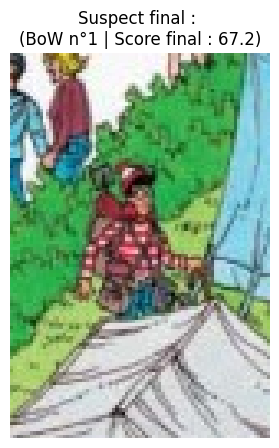

In [26]:
charlie_final = identification_finale(charlie_identifie, planche_file)